In [1]:
import numpy as np
import sys, os, time
import cv2
import matplotlib.pyplot as plt
from IPython.display import clear_output
from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics import mean_absolute_error as MAE
%matplotlib inline
#%matplotlib notebook

In [2]:
def imshow(img, gray=False, size=(6, 6)):
    plt.figure(figsize=size)
    if gray:
        plt.imshow(img, cmap='gray')
    else:
        plt.imshow(img)
    plt.show()

In [6]:
class Video:
    def __init__(self, fn):
        self.w = 288//2
        self.h = 352//2
        self.len = 300
        self.f = open(fn, 'rb')
        self.frame = []
        self.read()
        
    def read(self):
        for _ in range(self.len):
            raw = self.f.read(self.w*self.h*3//2)
            frame = np.frombuffer(raw, dtype=np.uint8)
            frame = frame.reshape((self.w*3//2, self.h))
            img = cv2.cvtColor(frame, cv2.COLOR_YUV2RGB_I420)
            self.frame.append(img)
            
    def show_frame(self, idx):
        plt.close()
        plt.clf()
        plt.imshow(self.frame[idx])
        plt.axis('off')
        plt.show()
    
    def show_video(self):
        plt.close()
        fig = plt.figure()
        ax = fig.add_subplot(111)
        plt.ion()
        fig.show()
        fig.canvas.draw()
        for idx in range(self.len):
            ax.clear()
            plt.axis('off')
            ax.imshow(video[idx])
            fig.canvas.draw()
            plt.pause(0.001)
        
    def __getitem__(self, idx):
        return self.frame[idx]
    
    def __len__(self):
        return len(self.len)

In [7]:
from skimage.io import imread, imsave
from subprocess import call

def inpaint(target, mask):
    target_path = "target.jpg"
    mask_path = "mask.jpg"
    imsave(target_path, target)
    plt.imsave(mask_path, mask, cmap='gray')
    call(["python", "__main__.py", target_path, mask_path])
    result = imread("output.jpg")
    return result
    imshow(result)

In [8]:
video = Video('Table.QCIF')
#video = Video('Stefan.CIF')
#video = Video('tt.yuv')

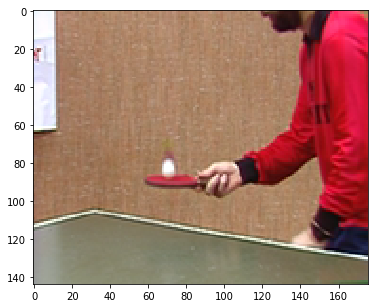

In [12]:
imshow(video[40])

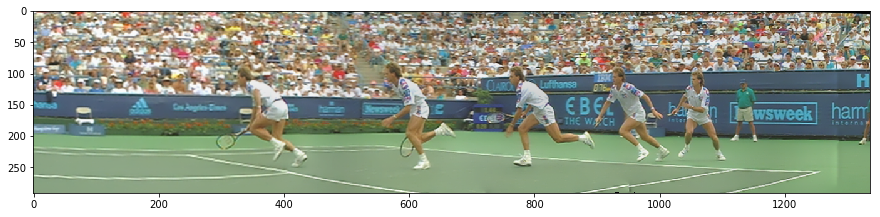

In [372]:
#from panorama import Panorama
#pano = Panorama([video[i] for i in range(0, 299, 10)])
plt.figure(figsize=(15, 10))
plt.imshow(pano.pano)
plt.show()

In [501]:
def alignImages(im1, im2, GOOD_MATCH_PERCENT = 0.1):
    MAX_FEATURES = 800
    
 
    # Convert images to grayscale
    im1Gray = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
    im2Gray = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)

    # Detect ORB features and compute descriptors.
    orb = cv2.ORB_create(MAX_FEATURES)
    keypoints1, descriptors1 = orb.detectAndCompute(im1Gray, None)
    keypoints2, descriptors2 = orb.detectAndCompute(im2Gray, None)

    # Match features.
    matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
    matches = matcher.match(descriptors1, descriptors2, None)

    # Sort matches by score
    matches.sort(key=lambda x: x.distance, reverse=False)

    # Remove not so good matches
    numGoodMatches = int(len(matches) * GOOD_MATCH_PERCENT)
    matches = matches[:numGoodMatches]

    # Draw top matches
    imMatches = cv2.drawMatches(im1, keypoints1, im2, keypoints2, matches, None)
    cv2.imwrite("matches.jpg", imMatches)

    # Extract location of good matches
    points1 = np.zeros((len(matches), 2), dtype=np.float32)
    points2 = np.zeros((len(matches), 2), dtype=np.float32)

    for i, match in enumerate(matches):
        points1[i, :] = keypoints1[match.queryIdx].pt
        points2[i, :] = keypoints2[match.trainIdx].pt

    # Find homography
    h, mask = cv2.findHomography(points1, points2, cv2.RANSAC)

    # Use homography
    height, width, channels = im2.shape
    im1Reg = cv2.warpPerspective(im1, h, (width, height))

    return im1Reg, h

In [75]:
def n_black(img):
    r = img[:,:,0]
    g = img[:,:,1]
    b = img[:,:,2]
    black = np.logical_and(np.logical_and((r==0), (g==0)), (b==0))
    return black.sum()/len(black.flatten())

(291, 1337, 3) (291, 1337, 3)


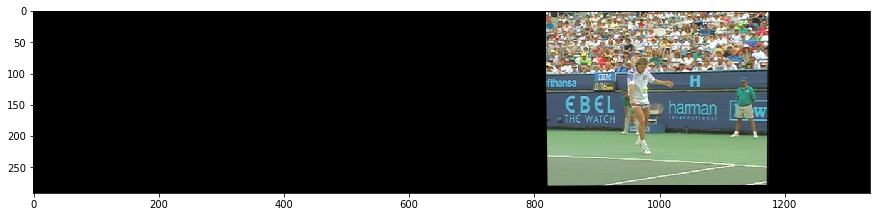

0.7439104318793421


In [427]:
imReg, h = alignImages(video[20], pano.pano)
print (imReg.shape, pano.pano.shape)
imshow(imReg, size=(15, 10))
print (n_black(imReg))

In [280]:
from collections import Counter

p = pano.pano
filt = np.array([[Counter() for i in range(p.shape[1])] for j in range(p.shape[0])])
print (filt.shape)

for j in range(p.shape[0]):
    for k in range(p.shape[1]):
        color = tuple(p[j][k])
        filt[j][k][color] += 1

for i in range(300):
    imReg, h = alignImages(video[i], p)
    if n_black(imReg) < 0.55:
        continue
    for j in range(p.shape[0]):
        for k in range(p.shape[1]):
            color = tuple(imReg[j][k])
            filt[j][k][color] += 1
    print (i, end='\r')

(291, 1337)


In [292]:
bg = np.zeros(p.shape)

for i in range(p.shape[0]):
    for j in range(p.shape[1]):
        color = filt[i][j].most_common(7)
        for k in color:
            if k[0] != (0, 0, 0) and k[0] != (255, 255, 255) and np.sum(k[0]) > 80 and np.sum(k[0]) < 700:
                bg[i][j] = k[0]

In [268]:
filt[120][400].most_common(5)

[((0, 0, 0), 255),
 ((16, 16, 13), 3),
 ((14, 13, 10), 2),
 ((16, 16, 14), 1),
 ((15, 14, 10), 1)]

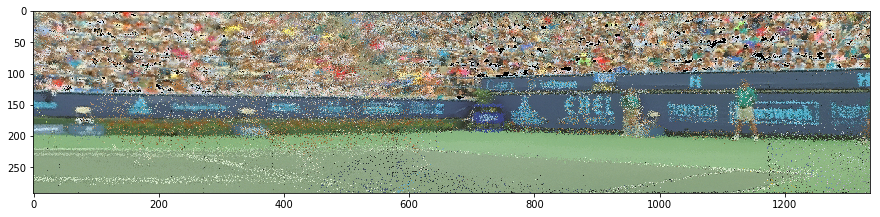

In [293]:
bg = bg.astype(np.uint8)
plt.figure(figsize=(15, 10))
plt.imshow(bg)
plt.show()

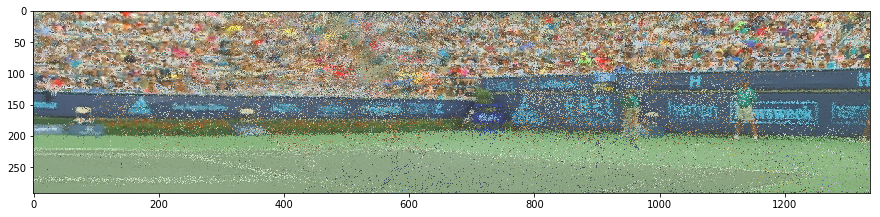

In [290]:
tmp = bg.copy()
for i in range(p.shape[0]):
    for j in range(p.shape[1]):
        if np.sum(tmp[i][j]) < 180 or np.sum(tmp[i][j]) > 650:
            tmp[i][j] = p[i][j]
            
plt.figure(figsize=(15, 10))
plt.imshow(tmp)
plt.show()

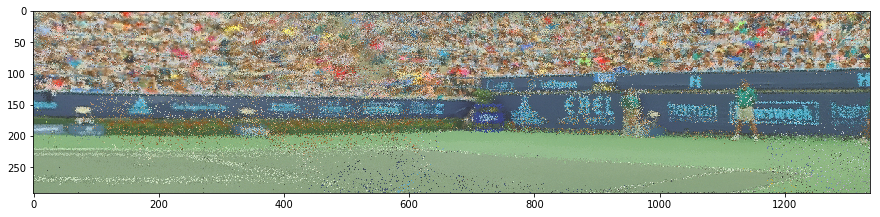

In [265]:
mask = np.zeros((291, 1337)).astype(np.uint8)
for i in range(p.shape[0]):
    for j in range(p.shape[1]):
        if np.sum(bg[i][j]) < 180 or np.sum(bg[i][j]) > 650:
            mask[i][j] = 1

dst = cv2.inpaint(bg.copy(), mask, 3, cv2.INPAINT_TELEA)
plt.figure(figsize=(15, 10))
plt.imshow(dst)
plt.show()

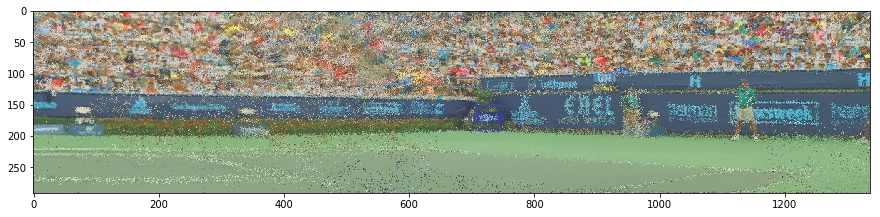

In [295]:
mask = np.zeros((291, 1337)).astype(np.uint8)
for i in range(p.shape[0]):
    for j in range(p.shape[1]):
        if np.sum(bg[i][j]) < 180 or np.sum(bg[i][j]) > 650:
            mask[i][j] = 1

dst = cv2.inpaint(bg.copy(), mask, 3, cv2.INPAINT_NS)
plt.figure(figsize=(15, 10))
plt.imshow(dst)
plt.show()

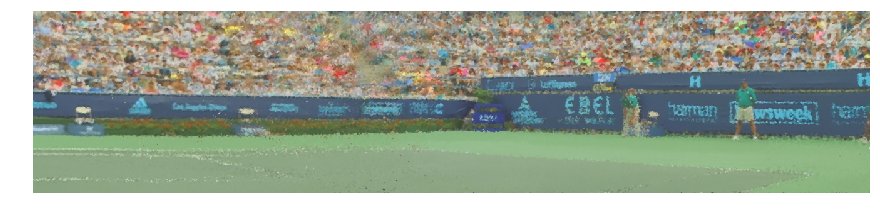

In [334]:
from scipy import ndimage
im_blur = cv2.medianBlur(dst, 3)
plt.figure(figsize=(15, 10))
plt.imshow(im_blur)
plt.axis('off')
plt.show()

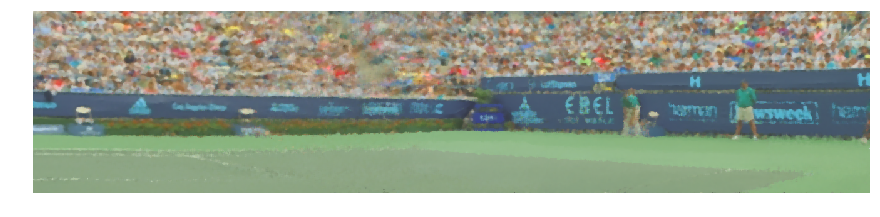

In [359]:
im_blur = cv2.medianBlur(dst, 5)
plt.figure(figsize=(15, 10))
plt.imshow(im_blur)
plt.axis('off')
plt.imsave('bg.png', im_blur)
plt.show()

In [ ]:
m = np.zeros(tmp.shape[:2])
for i in range(m.shape[0]):
    for j in range(m.shape[1]):
        if np.sum(tmp[i][j]) == 0:
            m[i][j] = 1

imshow(m, gray=True)
imshow(inpaint(tmp, m))

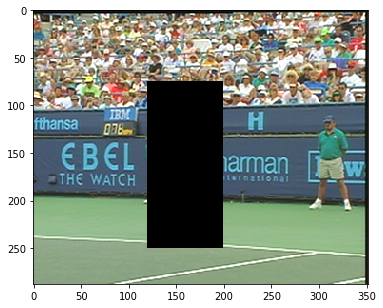

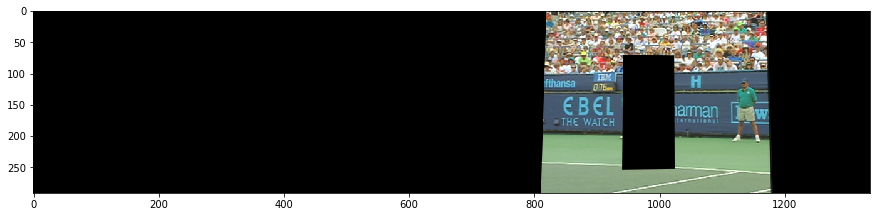

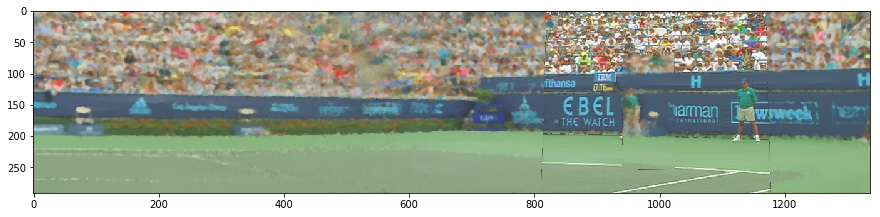

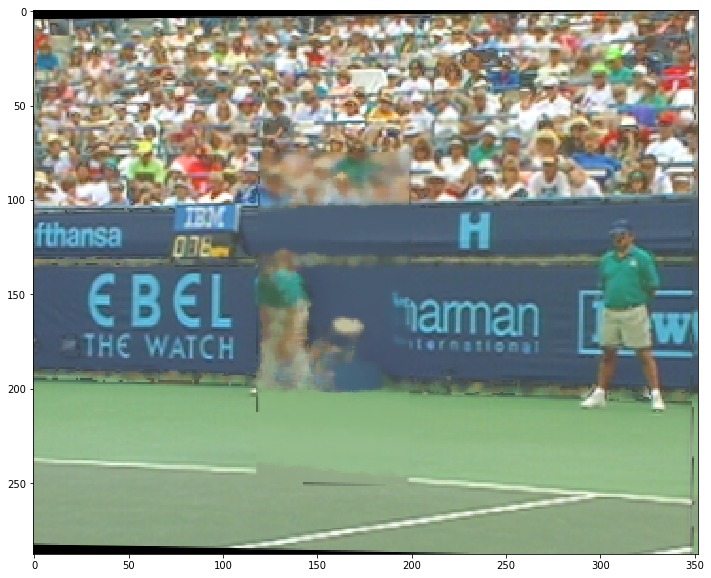

In [721]:
tmp = video[20].copy()
tmp[75:250, 120:200] = 0
imshow(tmp)
imReg, h = alignImages(tmp, im_blur)
plt.figure(figsize=(15, 10))
plt.imshow(imReg)
plt.show()
for i in range(imReg.shape[0]):
    for j in range(imReg.shape[1]):
        if np.sum(imReg[i][j]) < 200:
            imReg[i][j] = im_blur[i][j]
plt.figure(figsize=(15, 10))
plt.imshow(imReg)
plt.show()

imReg2, h = alignImages(imReg, video[20])
plt.figure(figsize=(15, 10))
plt.imshow(imReg2)
plt.show()

block


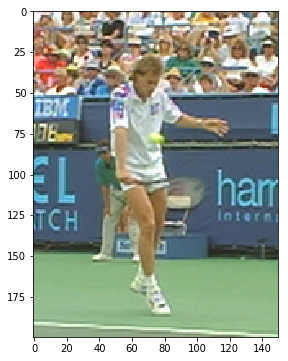

current frame


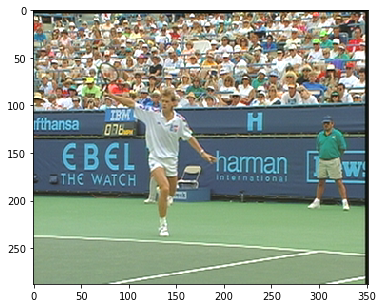

results


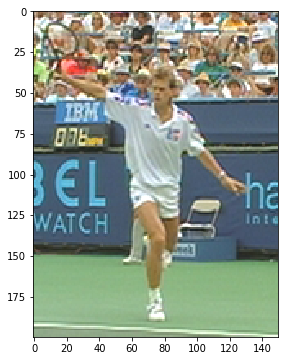

In [732]:
block = video[20][50:250, 80:230].copy()
print ('block')
imshow(block)
print ('current frame')
imshow(video[28].copy())
x, y = TSS(video[28].copy(), block, 20, 50)
print ('results')
imshow(video[28][x:x+block.shape[0], y:y+block.shape[1]])

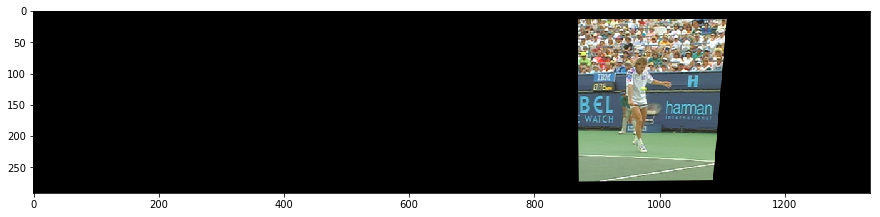

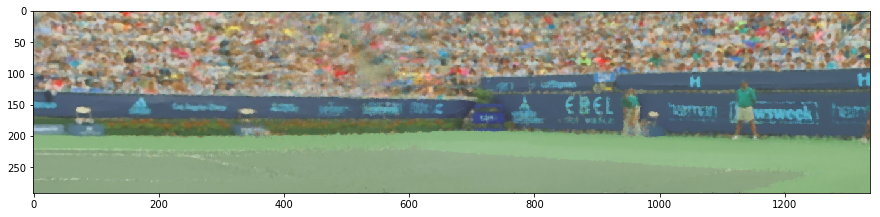

In [696]:
imReg, h = alignImages(block, im_blur, GOOD_MATCH_PERCENT = 0.05)
plt.figure(figsize=(15, 10))
plt.imshow(imReg)
plt.show()
imshow(im_blur, size=(15, 10))

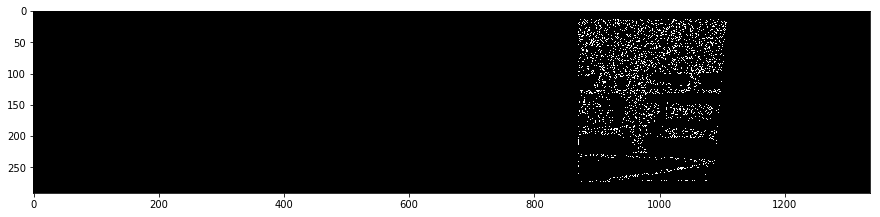

In [702]:
m = np.zeros(p.shape)
for i in range(imReg.shape[0]):
    for j in range(imReg.shape[1]):
        if np.sum(imReg[i][j]) != 0:
            diff = MSE(imReg[i][j], im_blur[i][j])
            #print (diff)
            if diff > 150:
                m[i][j] = 1

imshow(m, gray=True, size=(15, 10))

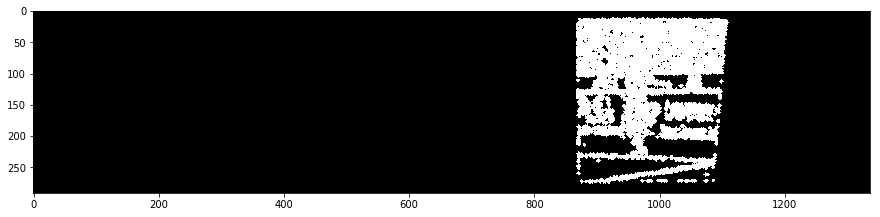

In [711]:
tmp = cv2.dilate(m, kernel=cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3)), iterations = 3)
#tmp = cv2.erode(tmp, kernel=cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2,2)), iterations = 3)
#tmp = cv2.dilate(tmp, kernel=cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3)), iterations = 3)
imshow(tmp, gray=True, size=(15, 10))

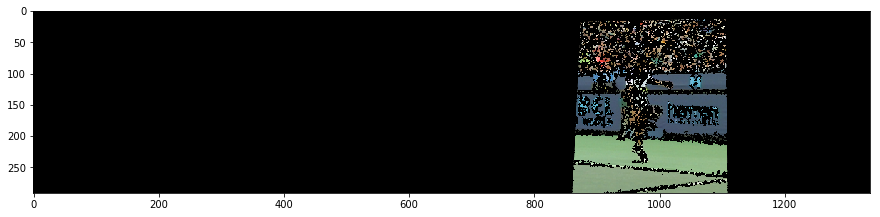

In [663]:
xxx = imReg.copy()
xxx[np.where(tmp==1)] = 0
imshow(xxx, size=(15, 10))

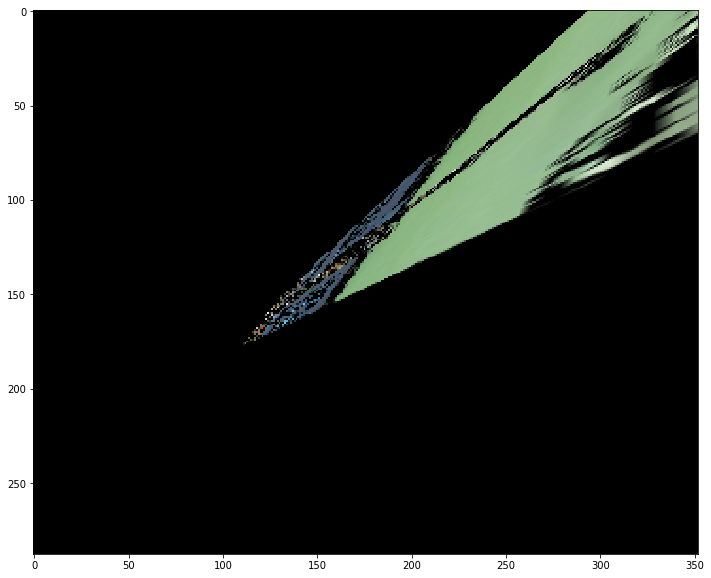

In [716]:
imReg, h = alignImages(xxx, video[21], GOOD_MATCH_PERCENT = 0.1)
plt.figure(figsize=(15, 10))
plt.imshow(imReg)
plt.show()

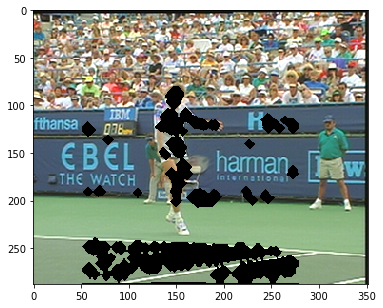

In [613]:
org = video[20].copy()
for i in range(org.shape[0]):
    for j in range(org.shape[1]):
        if i > 20 and i < 290 and j > 50 and j < 280:
            if np.sum(imReg[i][j]) == 0:
                org[i][j] = 0

imshow(org)

In [ ]:
m = org.copy()
m[np.where(m)]
result = inpaint()

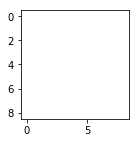

In [88]:
a = (56, 102)
b = (60, 106)
frame = video[132]
block = frame[a[0]:b[0], a[1]:b[1], :]
block = np.ones((9, 9, 3)).astype(int)*255
#block[0][0], block[0][3], block[3][0], block[3][3] = 0, 0, 0, 0
plt.figure(figsize=(2, 2))
plt.imshow(block)
plt.show()

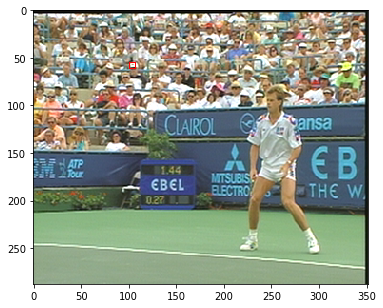

In [111]:
aa = (101, 55)
bb = (107, 61)
img = cv2.rectangle(video[132].copy(), aa, bb, color=(255, 0, 0))
imshow(img)

(6, 6, 3)


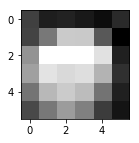

In [41]:
print (block.shape)
block = cv2.cvtColor(block, cv2.COLOR_RGB2GRAY)
plt.figure(figsize=(2, 2))
plt.imshow(block, cmap='gray')
plt.show()

In [15]:
def TSS(frame, block, xx, yy):
    step_size = 64
    gray = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
    min_val = 999999999999999999999999999999999999.
    x, y = xx, yy
    
    for _ in range(4):
        for i in range(x-step_size, x+step_size+1, step_size):
            for j in range(y-step_size, y+step_size+1, step_size):
                if i < 0 or i >= frame.shape[0]-block.shape[0] or j < 0 or j >= frame.shape[1]-block.shape[1]:
                    continue
                target = frame[i:i+block.shape[0], j:j+block.shape[1]].copy()
                #imshow(target)
                #mse = MSE(target, block)
                mse = compare_mse(target, block)
                #print (mse)
                if mse < min_val:
                    min_val = mse
                    match = (i, j)
        
        #print (mse)
        x, y = match
        step_size = step_size//2
    
    return x, y

In [14]:
from skimage.measure import compare_nrmse, compare_ssim, compare_mse

def FS(frame, block, xx, yy):
    step_size = 64
    gray = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
    min_val = 9999999999999999999999999.
    x, y = xx, yy
    
    for i in range(x-step_size, x+step_size+1, 1):
        for j in range(y-step_size, y+step_size+1, 1):
            if i < 0 or i >= frame.shape[0]-block.shape[0] or j < 0 or j >= frame.shape[1]-block.shape[1]:
                continue
            target = frame[i:i+block.shape[0], j:j+block.shape[1]]
            #imshow(target, gray=True)
            #mse = MSE(target.flatten(), block.flatten())
            mse = compare_mse(target, block)
            #print(mse)
            if mse < min_val:
                min_val = mse
                match = (i, j)
                
    #print ('\nmin_val:', min_val)
    return match

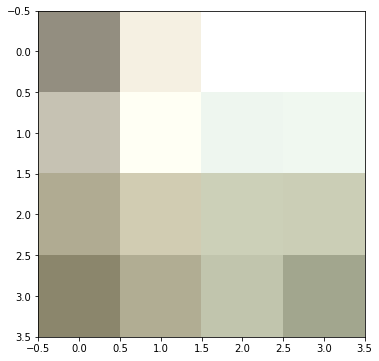

In [73]:
x, y = FS(video[133], block, a[0], a[1])
found = video[133][x:x+block.shape[0], y:y+block.shape[0]]
imshow(found)

(57, 52) (61, 56)


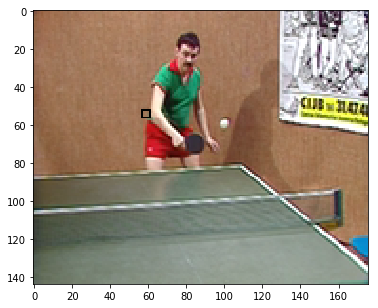

In [81]:
aa = (y, x)
bb = (y+block.shape[0], x+block.shape[0])
print (aa, bb)
img = cv2.rectangle(video[133].copy(), aa, bb, color=0)
imshow(img)

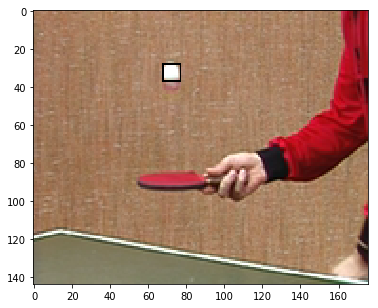

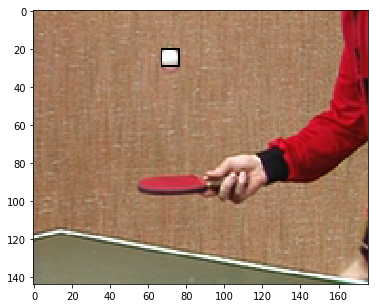

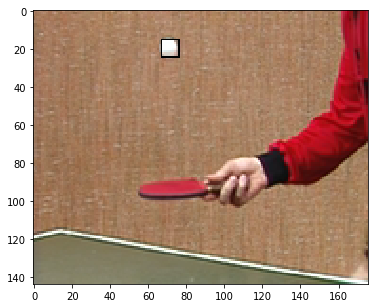

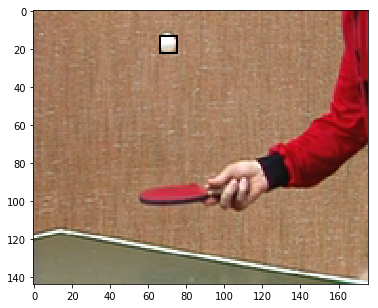

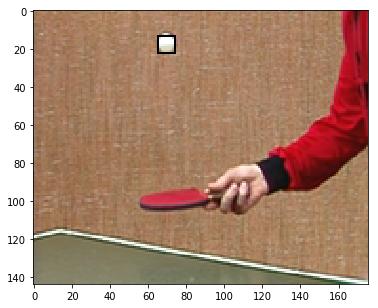

...

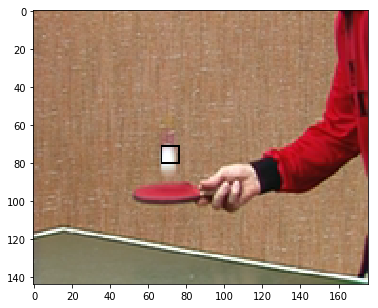

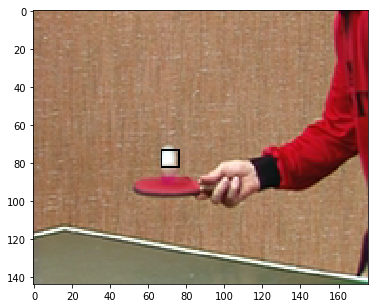

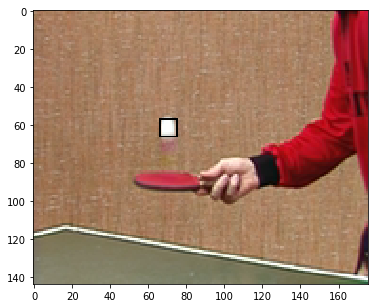

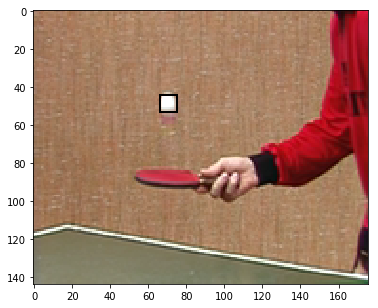

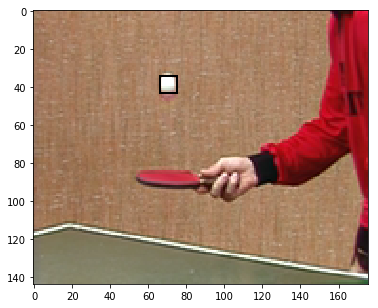

In [91]:
x, y = 15, 60
masks = [(x, y)]
for i in range(0, 30):
    x, y = FS(video[i], block, x, y)
    masks.append((x, y))
    aa = (y, x)
    bb = (y+block.shape[0], x+block.shape[0])
    img = cv2.rectangle(video[i].copy(), aa, bb, color=0)
    imshow(img)

<IPython.core.display.Javascript object>


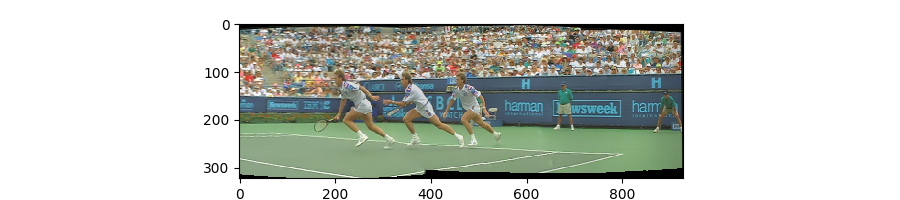

In [52]:
plt.figure(figsize=(9, 2))
plt.imshow(pano)
plt.show()

In [650]:
bgmodel = []
masks = []
#plt.close()
#fig = plt.figure()
#ax = fig.add_subplot(111)
#plt.ion()
#fig.show()
#fig.canvas.draw()
mog = cv2.createBackgroundSubtractorMOG2(history=15, varThreshold=16, detectShadows=False)

for idx in range(300):
    #ax.clear()
    #plt.axis('off')
    #mog = cv2.createBackgroundSubtractorMOG2(history=2000, varThreshold=16, detectShadows=True)
    fgmask = mog.apply(video[idx], 1)
    fgthres = cv2.threshold(fgmask.copy(), 200, 255, cv2.THRESH_BINARY)[1]
    fgdilated = cv2.dilate(fgthres, kernel=cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3)), iterations = 1)
    bg = mog.getBackgroundImage()
    #ax.imshow(bg)
    bgmodel.append(bg)
    #masks.append(fgdilated)
    masks.append(fgdilated)
    
    #fig.canvas.draw()
    #plt.pause(0.005)

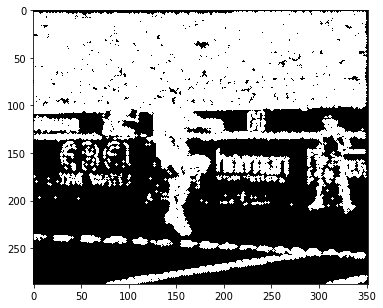

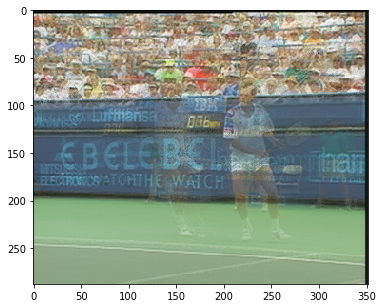

In [651]:
imshow(masks[20], gray=True)
imshow(bgmodel[20])

In [299]:
v2 = Video('Table.QCIF')

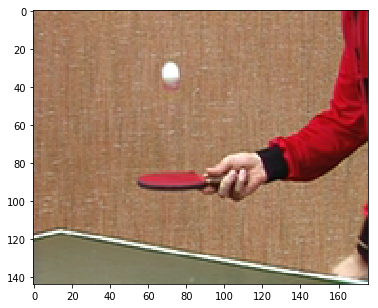

In [362]:
imshow(v2[0])

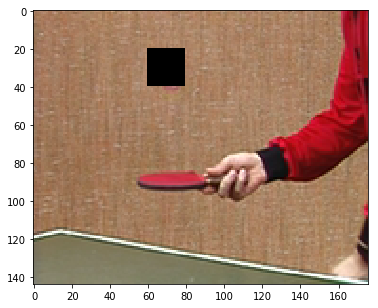

(144, 176)


In [368]:
from skimage.io import imread, imsave
tmp = v2[0].copy()
tmp[20:40, 60:80] = 0
imshow(tmp)
imsave('target.jpg', tmp)
m = np.zeros((tmp.shape[0], tmp.shape[1]))
print (m.shape)
m[20:40, 60:80] = 255
plt.imsave('mask.jpg', m, cmap='gray')

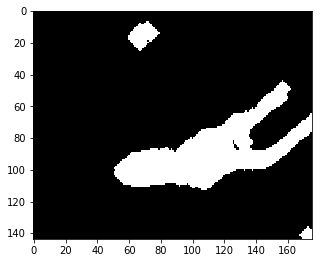

In [302]:
bgmodel = []
mog = cv2.createBackgroundSubtractorMOG2(history=1000, varThreshold=160, detectShadows=False)

for idx in range(5):
    fgmask = mog.apply(v2[idx], 0.9)
    fgthres = cv2.threshold(fgmask.copy(), 200, 255, cv2.THRESH_BINARY)[1]
    fgdilated = cv2.dilate(fgthres, kernel=cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3)), iterations = 5)
    bg = mog.getBackgroundImage()
    bgmodel.append(bg)
    
plt.figure(figsize=(5, 5))
plt.imshow(fgdilated, cmap='gray')
plt.show()

In [358]:
cv2.imwrite('mask.png', fgdilated)
tmp = v2[4].copy()
for i in range(tmp.shape[0]):
    for j in range(tmp.shape[1]):
        if fgdilated[i][j] == 255:
            tmp[i][j] = 0
            
plt.imsave('target.png', tmp)

<IPython.core.display.Javascript object>


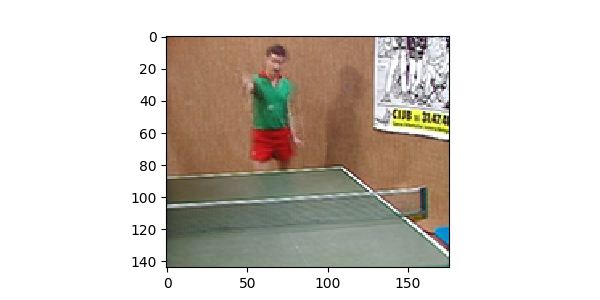

In [16]:
plt.figure(figsize=(6, 3))
plt.imshow(bgmodel[40])
plt.show()

In [ ]:
p2 = Panorama([v2[i] for i in range(132, 299, 10)])
plt.figure(figsize=(15, 10))
plt.imshow(p2.pano)
plt.show()

(144, 176)


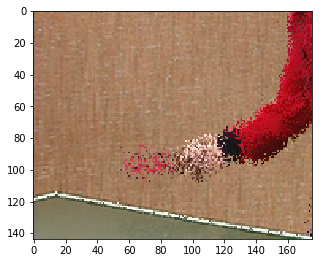

In [57]:
from collections import Counter

filt = np.array([[Counter() for i in range(176)] for j in range(144)])
print (filt.shape)

for i in range(30):
    for j in range(144):
        for k in range(176):
            color = tuple(targets[i][j][k])
            filt[j][k][color] += 1

            
            
bg = np.zeros((144, 176, 3))
for j in range(144):
    for k in range(176):
        color = filt[j][k].most_common(3)
        for c in color:
            if c[0] != (0, 0, 0):
                bg[j][k] = np.array(c[0])

bg = bg.astype(np.uint8)
plt.figure(figsize=(5, 5))
plt.imshow(bg)
plt.show()

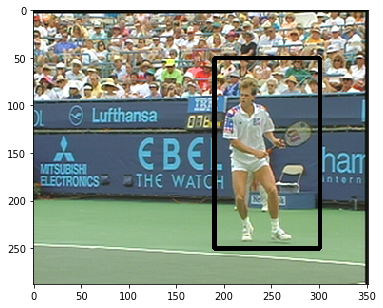

In [17]:
aa = (190, 50)
bb = (301, 250)
img = cv2.rectangle(video[0].copy(), aa, bb, color=0, thickness=3)
imshow(img)

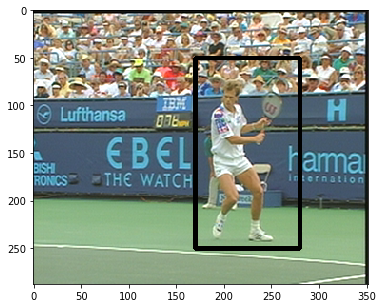

In [22]:
aa = (170, 50)
bb = (280, 250)
img = cv2.rectangle(video[5].copy(), aa, bb, color=0, thickness=3)
imshow(img)

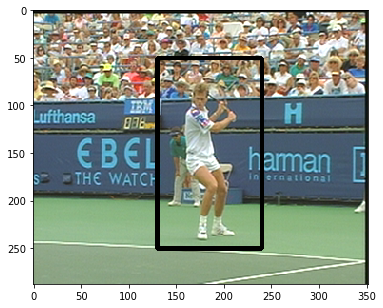

In [26]:
aa = (130, 50)
bb = (240, 250)
img = cv2.rectangle(video[10].copy(), aa, bb, color=0, thickness=3)
imshow(img)

block


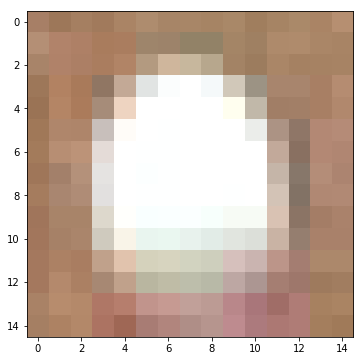

current frame


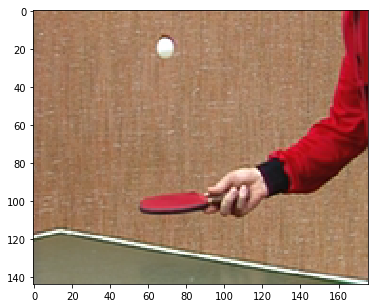

results


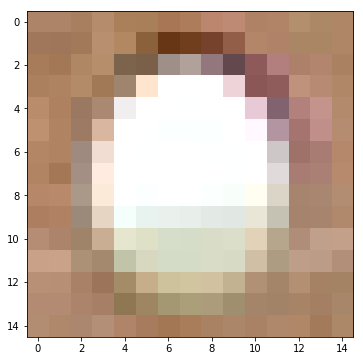

In [24]:
block = video[0][25:40, 65:80].copy()
print ('block')
imshow(block)
print ('current frame')
imshow(video[5].copy())
x, y = FS(video[5].copy(), block, 25, 65)
print ('results')
imshow(video[5][x:x+block.shape[0], y:y+block.shape[1]])

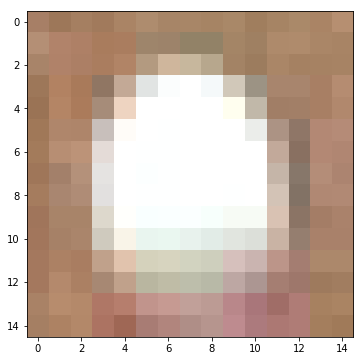

In [103]:
p, q = 15, 15
x, y = 25, 65
targets, masks = [], []
block = video[0][x:x+p, y:y+q].copy()
imshow(block)

for idx in range(40):
    t = video[idx].copy()
    diff = np.sum((t-bg)**2, axis=2)
    m = np.zeros(t.shape[:2])
    m[x:x+p, y:y+q] = 1
    loc = np.logical_and(diff>40, m==1)
    t[np.where(loc)] = np.array([0,0,0])
    targets.append(t)
    #imshow(t)
    m = np.zeros(t.shape[:2])
    m[loc] = 1
    masks.append(m)
    #imshow(m, gray=True)
    x, y = FS(video[idx+1].copy(), block, x, y)
    #imshow(video[idx+1][x:x+p, y:y+q])
    #break

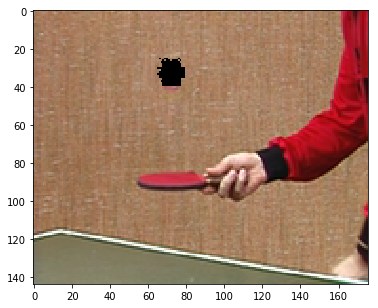

In [107]:
imshow(targets[0])

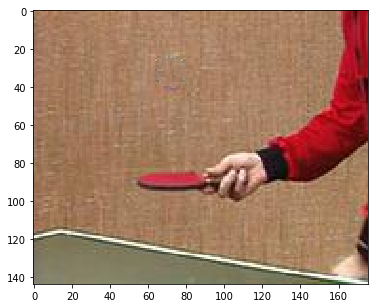

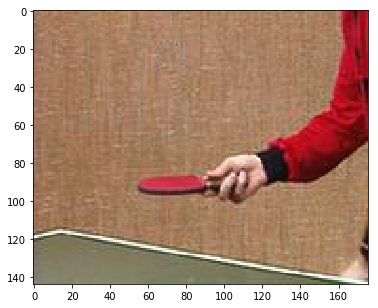

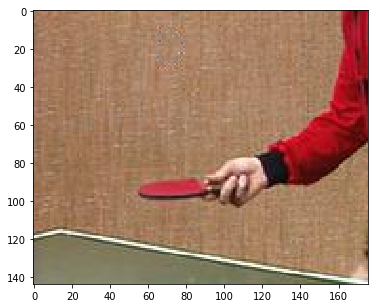

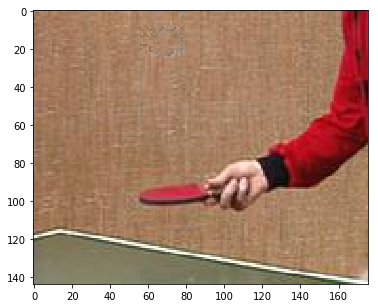

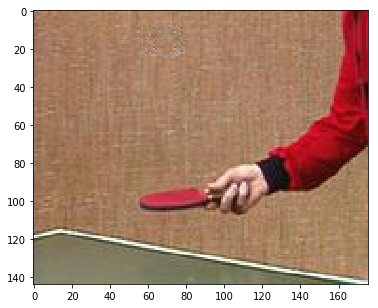

...

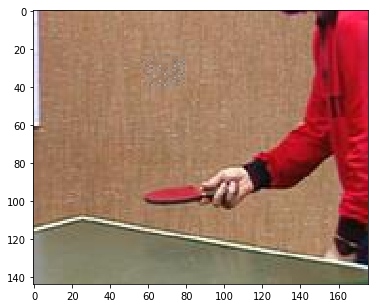

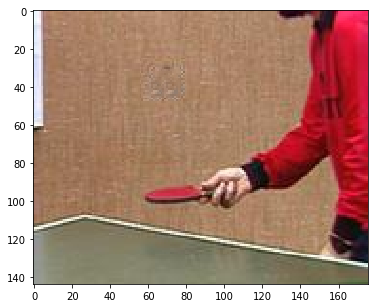

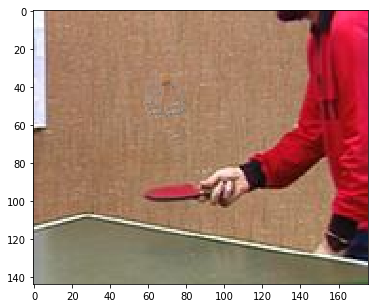

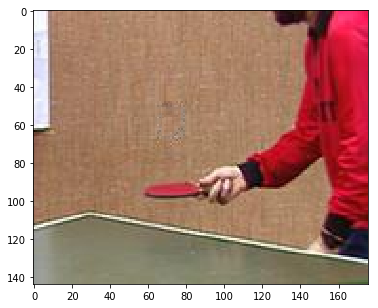

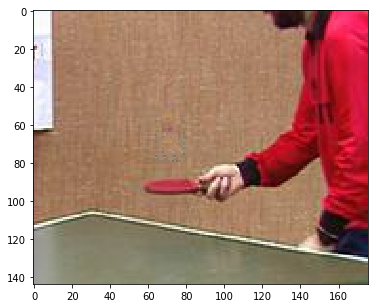

In [106]:
import os
results = []
for i in range(len(targets)):
    result = inpaint(targets[i], masks[i])
    results.append(result)
    plt.imsave(os.path.join('result4', str(i)+".jpg"), result)
    imshow(result)
    print (i, end='\r')

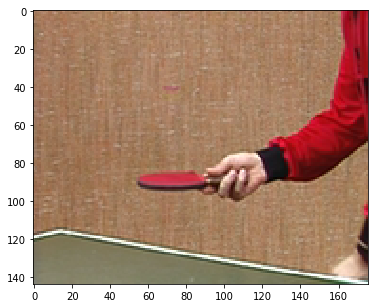

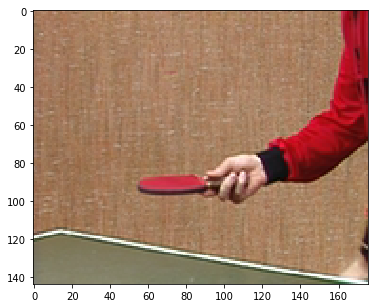

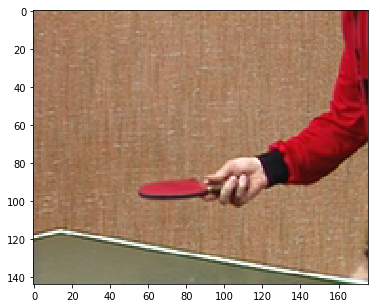

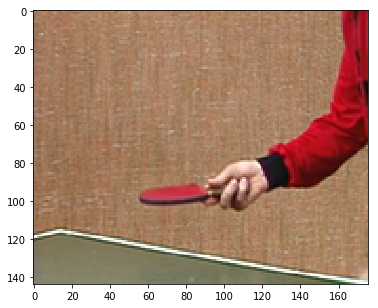

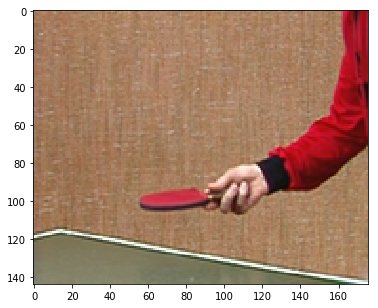

...

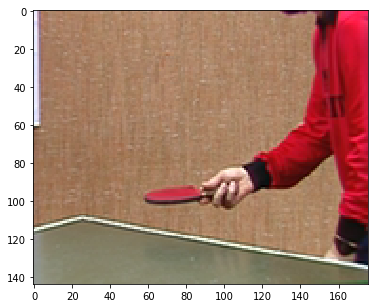

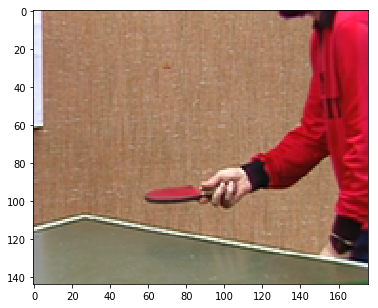

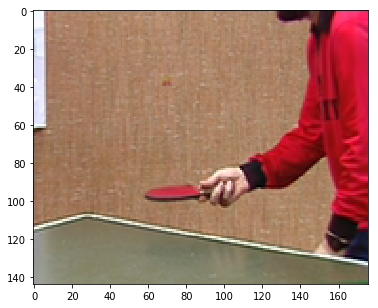

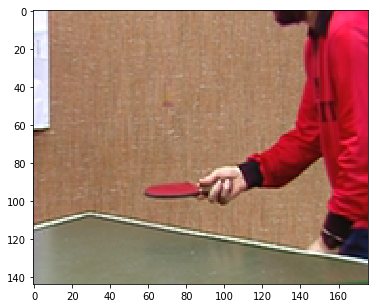

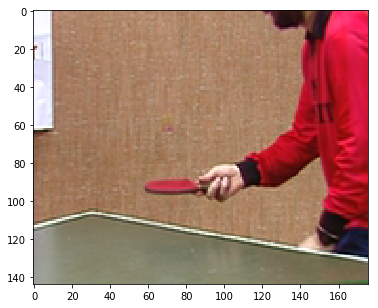

In [71]:
results2 = []
for i in targets:
    tmp = i.copy()
    #imshow(tmp)
    for j in range(144):
        for k in range(176):
            if tuple(tmp[j][k]) == (0, 0, 0):
                tmp[j][k] = bg[j][k]
    imshow(tmp)
    results2.append(tmp)
    #break

to_video(results2, "table_inpaint2.yuv")

In [70]:
def to_video(imgs, fn):
    with open(fn, 'wb') as f:
        for img in imgs:
            out = cv2.cvtColor(img, cv2.COLOR_RGB2YUV_I420)
            f.write(np.array(out).tobytes())

In [47]:
to_video(results, "table_inpaint.yuv")